In [1]:
%cd "../.."

/home/ensai/projet-statistique-2022


In [2]:
from gensim import models
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import json
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances
import hdbscan as HD
from sklearn.mixture import GaussianMixture as GMM
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids
from sklearn.manifold import TSNE

import seaborn as sns
import plotly.express as px


from word_embedding.distance_wmd import *
import doc_embedding.moyenne as moyenne
from reduction_dim.correlation_matrix import *
import clustering.fit_clustering as CL 

import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [3]:
with open('data/docs.json', encoding = "utf8") as f:
    docs = json.load(f)

dict_moy_embedding = {}
for modele in ["glove","cbow","skipgram"]:
    ev = models.KeyedVectors.load_word2vec_format(f"data/tuning/{modele}.kv")
    #Read moy matrix
    dict_moy_embedding[modele] = {}
    dict_moy_embedding[modele]["TF"] = moyenne.word_emb_vers_doc_emb_moyenne(docs, ev, methode = 'TF')
    dict_moy_embedding[modele]["TFIDF"] = moyenne.word_emb_vers_doc_emb_moyenne(docs, ev, methode = 'TF-IDF')

In [4]:
dict_wmd_embedding = {}
for modele in ["glove","cbow","skipgram"]:
    #Read moy matrix
    dict_wmd_embedding[modele] = {}
    dict_wmd_embedding[modele]["Distance"] = np.array(lecture_fichier_distances_wmd(f"distances_{modele}.7z"))
    if modele != "glove":
        dict_wmd_embedding[modele]["MDS"] = np.array(pd.read_csv(f"data/tuning/MDS/{modele}_mds_embedding.csv",sep=";",header=0))

In [5]:
dict_embedding = {}
dict_embedding["WMD"] = dict_wmd_embedding
dict_embedding["Moyenne"] = dict_moy_embedding

In [57]:
df_hdbscan_clustering = pd.read_csv("data/tuning/clustering/hdbscan.csv",sep=";")
df_hdbscan_clustering["clustering"] = "hdbscan"
df_hdbscan_clustering["K"]  = df_hdbscan_clustering["K"] - 1
df_kmeans_clustering = pd.read_csv("data/tuning/clustering/kmeans.csv",sep=";")
df_gmm_clustering = pd.read_csv("data/tuning/clustering/gmm.csv",sep=";")
df_gmm_clustering["clustering"] = "gmm"
df_clustering = pd.concat([df_hdbscan_clustering,df_kmeans_clustering,df_gmm_clustering])
df_clustering = df_clustering[df_clustering["K"]>=5]
df_clustering = df_clustering[df_clustering["K"]<=20]
df_clustering["silhouette-DBCV"] = df_clustering[["silhouette","DBCV"]].apply(np.mean,axis=1)
df_clustering.head()

,voisinage,min_cluster_size,distance,K,silhouette,Cal-Harabasz,DBCV,non_classes,perplexity,wordEmbedding,docEmbedding,docEmbedding2,clustering,initialisation,nb_iter,tolerance,val_obj,covariance,BIC,silhouette-DBCV
41,20.0,11.0,precomputed,5,0.321917,NaN,0.119809,671.0,NaN,cbow,WMD,Distance,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,0.220863
42,20.0,12.0,precomputed,5,0.321917,NaN,0.119809,671.0,NaN,cbow,WMD,Distance,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,0.220863
51,19.0,10.0,precomputed,5,0.315283,NaN,0.114788,680.0,NaN,cbow,WMD,Distance,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,0.215035
60,10.0,10.0,precomputed,5,0.340517,NaN,0.108204,580.0,NaN,cbow,WMD,Distance,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,0.224361
81,42.0,10.0,precomputed,5,0.303762,NaN,0.089011,695.0,NaN,cbow,WMD,Distance,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,0.196387


# Clustering Avant Tsne

In [59]:
df_clustering_before = df_clustering.loc[(df_clustering["perplexity"].isna())].reset_index()

In [60]:
df_clustering_before.loc[df_clustering_before.groupby(["wordEmbedding"])["Cal-Harabasz"].idxmax()]

,index,voisinage,min_cluster_size,distance,K,silhouette,Cal-Harabasz,DBCV,non_classes,perplexity,...,docEmbedding,docEmbedding2,clustering,initialisation,nb_iter,tolerance,val_obj,covariance,BIC,silhouette-DBCV
252,186,NaN,NaN,NaN,5,0.405154,15339.302799,-0.753192,NaN,NaN,...,Moyenne,TFIDF,kmeans,random,10.0,0.0001,396.232829,NaN,NaN,-0.174019
312,578,NaN,NaN,NaN,5,0.035087,145.752720,-0.697669,NaN,NaN,...,Moyenne,TF,kmeans,k-means++,10.0,0.0001,0.417098,NaN,NaN,-0.331291
352,940,NaN,NaN,NaN,5,0.291723,5690.425304,-0.805468,NaN,NaN,...,Moyenne,TFIDF,kmeans,random,10.0,0.0001,604.194378,NaN,NaN,-0.256873


In [61]:
df_clustering_before.loc[df_clustering_before.groupby(["wordEmbedding"])["silhouette"].idxmax()]

,index,voisinage,min_cluster_size,distance,K,silhouette,Cal-Harabasz,DBCV,non_classes,perplexity,...,docEmbedding,docEmbedding2,clustering,initialisation,nb_iter,tolerance,val_obj,covariance,BIC,silhouette-DBCV
253,187,NaN,NaN,NaN,5,0.405681,15337.873936,-0.749637,NaN,NaN,...,Moyenne,TFIDF,kmeans,k-means++,10.0,0.0001,396.268091,NaN,NaN,-0.171978
702,1810,NaN,NaN,NaN,5,0.160676,48.114086,-0.616269,NaN,NaN,...,Moyenne,TFIDF,gmm,NaN,NaN,NaN,NaN,full,-3.130738e+07,-0.227796
99,22141,6.0,10.0,euclidean,5,0.481659,489.760064,-0.248700,579.0,NaN,...,Moyenne,TFIDF,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,0.116480


In [62]:
df_clustering_before.loc[df_clustering_before.groupby(["wordEmbedding"])["DBCV"].idxmax()]

,index,voisinage,min_cluster_size,distance,K,silhouette,Cal-Harabasz,DBCV,non_classes,perplexity,...,docEmbedding,docEmbedding2,clustering,initialisation,nb_iter,tolerance,val_obj,covariance,BIC,silhouette-DBCV
0,41,20.0,11.0,precomputed,5,0.321917,NaN,0.119809,671.0,NaN,...,WMD,Distance,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,0.220863
67,10714,3.0,11.0,euclidean,11,-0.143543,12.868416,0.003273,9215.0,NaN,...,Moyenne,TF,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,-0.070135
179,53569,38.0,10.0,precomputed,6,0.187349,NaN,0.278496,481.0,NaN,...,WMD,Distance,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,0.232923


In [63]:
df_clustering_before.loc[df_clustering_before.groupby(["wordEmbedding"])["silhouette-DBCV"].idxmax()]

,index,voisinage,min_cluster_size,distance,K,silhouette,Cal-Harabasz,DBCV,non_classes,perplexity,...,docEmbedding,docEmbedding2,clustering,initialisation,nb_iter,tolerance,val_obj,covariance,BIC,silhouette-DBCV
3,60,10.0,10.0,precomputed,5,0.340517,NaN,0.108204,580.0,NaN,...,WMD,Distance,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,0.224361
687,1789,NaN,NaN,NaN,10,0.121942,40.366338,NaN,NaN,NaN,...,Moyenne,TFIDF,gmm,NaN,NaN,NaN,NaN,diag,-3.327373e+07,0.121942
179,53569,38.0,10.0,precomputed,6,0.187349,NaN,0.278496,481.0,NaN,...,WMD,Distance,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,0.232923


# Clustering Apres Tsne

In [64]:
df_clustering_after = df_clustering.loc[(df_clustering["perplexity"].notna())].reset_index()

In [65]:
df_clustering_after.loc[df_clustering_after.groupby(["wordEmbedding"])["Cal-Harabasz"].idxmax()]

,index,voisinage,min_cluster_size,distance,K,silhouette,Cal-Harabasz,DBCV,non_classes,perplexity,...,docEmbedding,docEmbedding2,clustering,initialisation,nb_iter,tolerance,val_obj,covariance,BIC,silhouette-DBCV
11158,338,NaN,NaN,NaN,14,0.404300,24527.133503,-0.618270,NaN,200.0,...,Moyenne,TFIDF,kmeans,k-means++,10.0,0.0001,2.545374e+05,NaN,NaN,-0.106985
12138,1924,NaN,NaN,NaN,10,0.373191,8995.073630,-0.757997,NaN,50.0,...,WMD,Distance,kmeans,random,10.0,0.0001,3.064856e+06,NaN,NaN,-0.192403
11638,1092,NaN,NaN,NaN,14,0.383962,14189.799335,-0.630786,NaN,200.0,...,Moyenne,TFIDF,kmeans,random,10.0,0.0001,3.457451e+05,NaN,NaN,-0.123412


In [66]:
df_clustering_after.loc[df_clustering_after.groupby(["wordEmbedding"])["DBCV"].idxmax()]

,index,voisinage,min_cluster_size,distance,K,silhouette,Cal-Harabasz,DBCV,non_classes,perplexity,...,docEmbedding,docEmbedding2,clustering,initialisation,nb_iter,tolerance,val_obj,covariance,BIC,silhouette-DBCV
431,2295,200.0,100.0,euclidean,5,-0.269958,753.185680,0.147703,5828.0,100.0,...,WMD,Distance,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,-0.061128
2531,14536,150.0,10.0,euclidean,11,-0.298547,276.077154,0.116965,5841.0,150.0,...,Moyenne,TF,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,-0.090791
8982,49886,48.0,100.0,euclidean,19,-0.162440,632.930565,0.115563,4671.0,75.0,...,Moyenne,TF,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,-0.023439


In [67]:
df_clustering_after.loc[df_clustering_after.groupby(["wordEmbedding"])["silhouette"].idxmax()]

,index,voisinage,min_cluster_size,distance,K,silhouette,Cal-Harabasz,DBCV,non_classes,perplexity,...,docEmbedding,docEmbedding2,clustering,initialisation,nb_iter,tolerance,val_obj,covariance,BIC,silhouette-DBCV
11176,356,NaN,NaN,NaN,5,0.493015,20271.669489,-0.659591,NaN,200.0,...,Moyenne,TFIDF,kmeans,random,10.0,0.0001,9.235383e+05,NaN,NaN,-0.083288
12214,2018,NaN,NaN,NaN,6,0.383739,8468.996606,-0.825968,NaN,125.0,...,WMD,Distance,kmeans,k-means++,10.0,0.0001,2.185364e+06,NaN,NaN,-0.221115
11451,819,NaN,NaN,NaN,8,0.412623,11656.610215,-0.708491,NaN,75.0,...,WMD,MDS,kmeans,random,10.0,0.0001,8.768532e+05,NaN,NaN,-0.147934


In [68]:
df_clustering_before.loc[df_clustering_before.groupby(["wordEmbedding"])["silhouette-DBCV"].idxmax()]

,index,voisinage,min_cluster_size,distance,K,silhouette,Cal-Harabasz,DBCV,non_classes,perplexity,...,docEmbedding,docEmbedding2,clustering,initialisation,nb_iter,tolerance,val_obj,covariance,BIC,silhouette-DBCV
3,60,10.0,10.0,precomputed,5,0.340517,NaN,0.108204,580.0,NaN,...,WMD,Distance,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,0.224361
687,1789,NaN,NaN,NaN,10,0.121942,40.366338,NaN,NaN,NaN,...,Moyenne,TFIDF,gmm,NaN,NaN,NaN,NaN,diag,-3.327373e+07,0.121942
179,53569,38.0,10.0,precomputed,6,0.187349,NaN,0.278496,481.0,NaN,...,WMD,Distance,hdbscan,NaN,NaN,NaN,NaN,NaN,NaN,0.232923


# Plot ScatterPlot

In [79]:
def plot_best(df_clustering,dict_embedding,clustering_metric="silhouette",modele="cbow"):
    best_model = df_clustering.loc[df_clustering.groupby(["wordEmbedding"])[clustering_metric].idxmin()] if clustering_metric == "BIC" else df_clustering.loc[df_clustering.groupby(["wordEmbedding"])[clustering_metric].idxmax()]
    best_model = best_model[best_model["wordEmbedding"]==modele]

    if len(best_model) > 0:
        tsne_metric = "precomputed" if best_model["docEmbedding2"].values[0] == "Distance" else "euclidean"
        first_reduce = best_model["perplexity"].notna().values[0]

        doc_embedding = dict_embedding[best_model["docEmbedding"].values[0]][modele]

        tsne = TSNE(n_components = 2, perplexity=200, n_iter=2000, random_state=0,metric=tsne_metric)
        tsne_embedding = tsne.fit_transform(doc_embedding[best_model["docEmbedding2"].values[0]])
        clustering_data = tsne_embedding if first_reduce else doc_embedding[best_model["docEmbedding2"].values[0]]

        type_clustering = best_model["clustering"].values[0].upper()

        if type_clustering == "HDBSCAN":
            clust_model = HD.HDBSCAN(min_cluster_size=int(best_model["min_cluster_size"].values[0]), metric = best_model["distance"].values[0],min_samples=int(best_model["voisinage"].values[0]))
        elif type_clustering == "GMM":
            clust_model = GMM(n_components=best_model["K"].values[0],covariance_type=best_model["covariance"].values[0])
        elif type_clustering == "KMEANS":
            clust_model = KMeans(n_clusters = best_model["K"].values[0], init = best_model["initialisation"].values[0])
        elif type_clustering == "KMEDOIDES":
            clust_model = KMedoids(n_clusters = best_model["K"].values[0], init = best_model["initialisation"].values[0], metric = 'precomputed')

        labels = clust_model.fit_predict(np.array(clustering_data).astype(np.float64))

        color_palette = sns.color_palette('Paired', len(np.unique(labels)))
        
        cluster_colors = [color_palette[x] if x >= 0 else (0.5, 0.5, 0.5) for x in labels]

        title = f"Best DocEmbedding Clustering based on {clustering_metric} metric from {type_clustering} algorithm"
        subtitle1 = f"WordEmbedding: {modele} - DocEmbedding: {best_model['docEmbedding'].values[0]} {best_model['docEmbedding2'].values[0]} - Reducing Before Clustering: {first_reduce}" 
        subtitle2 = f"Number of cluster: {len(np.unique(labels))} - Silhouette: {round(best_model['silhouette'].values[0],2)} - DBCV: {round(best_model['DBCV'].values[0],2)} - Calinski-Harabasz: {round(best_model['Cal-Harabasz'].values[0],2)}"
        title=f"{title}\n{subtitle1}\n{subtitle2}"


        return labels,tsne_embedding, cluster_colors, title
    else: 
        return [None, None,None,None]

In [81]:
a = 9
A = 7
print(A)

7


############################################################################################################################
                                                  SKIPGRAM                                                                         
############################################################################################################################


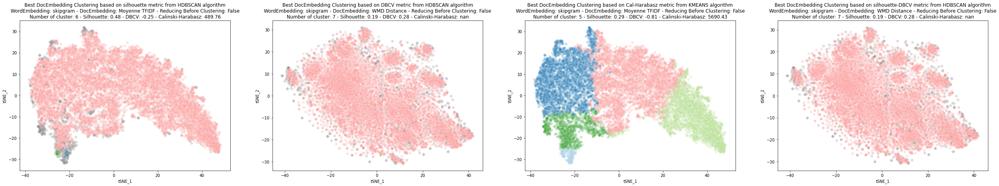

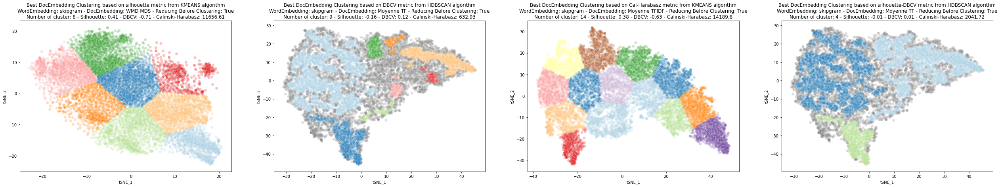

############################################################################################################################
                                                  GLOVE                                                                         
############################################################################################################################


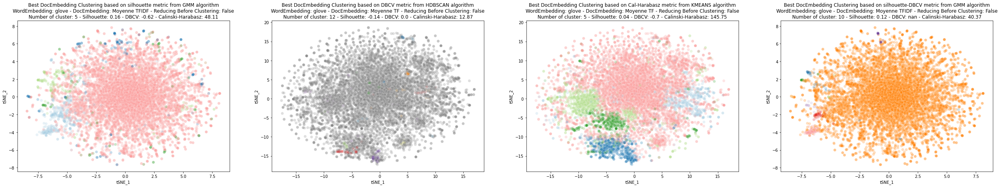

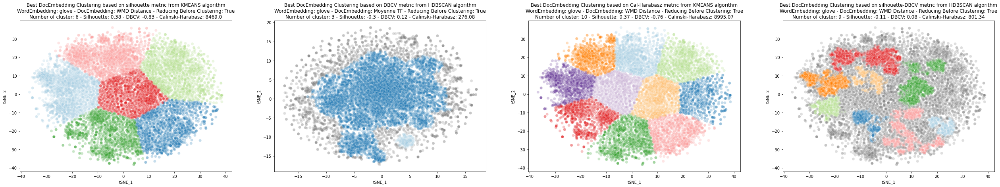

############################################################################################################################
                                                  CBOW                                                                         
############################################################################################################################


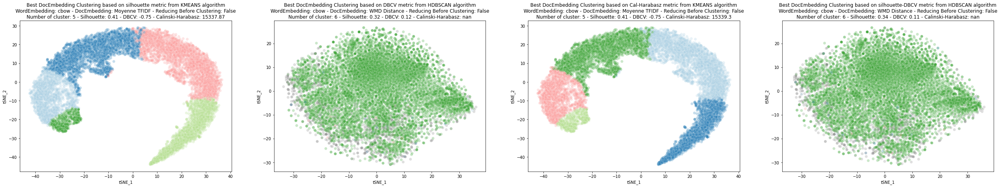

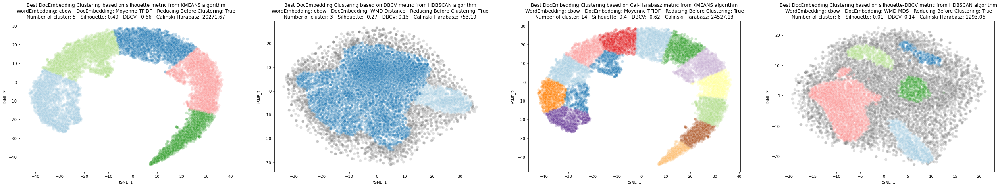

In [83]:
dict_label = {"ReductionFirst":{},"ReductionAfter":{}}
for modele in ["skipgram","glove","cbow"]:
    print("############################################################################################################################")
    print(f"                                                  {modele.upper()}                                                                         ")
    print("############################################################################################################################")
    dict_label["ReductionFirst"][modele] = {}
    dict_label["ReductionAfter"][modele] = {}
    for type_reduction in ["ReductionAfter","ReductionFirst"]:
        all_metric = ["silhouette","DBCV", "Cal-Harabasz","silhouette-DBCV"]

        plt.figure(figsize = (44,7))
        for i in range(len(all_metric)):
            #Silhouette
            if type_reduction == "ReductionAfter":
                Labels, Tsne, Colors, Title = plot_best(df_clustering_before,dict_embedding,clustering_metric=all_metric[i],modele=modele)
            else:
                Labels, Tsne, Colors, Title = plot_best(df_clustering_after,dict_embedding,clustering_metric=all_metric[i],modele=modele)
            dict_label[type_reduction][modele][all_metric[i]] = Labels

            #plot
            sns.scatterplot(Tsne[:,0],Tsne[:,1], s=50, c=Colors, alpha=0.25,ax=plt.subplot(1,len(all_metric),i+1,title=Title,xlabel="tSNE_1",ylabel="tSNE_2"))
        plt.show()


In [40]:
dict_label_copy = dict_label.copy()
for key1 in dict_label_copy.keys():
    for key2 in dict_label_copy[key1].keys():
        for key3 in dict_label_copy[key1][key2].keys():
            dict_label_copy[key1][key2][key3] = list(dict_label_copy[key1][key2][key3])

9501
9501
9501
9501
9501
9501
9501
9501
9501
9501
9501
9501
9501
9501
9501
9501
9501
9501


In [44]:
def convert(o):
    if isinstance(o, np.generic): return o.item()  
    raise TypeError
saveLabel=False
if saveLabel:
    with open("data/tuning/clustering/best_labels.json", "w") as output_file:
        json.dump(dict_label_copy,output_file,default=convert)

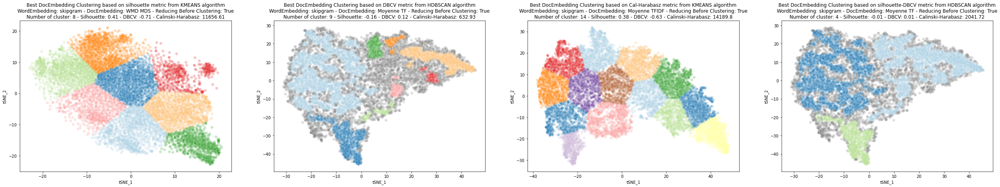

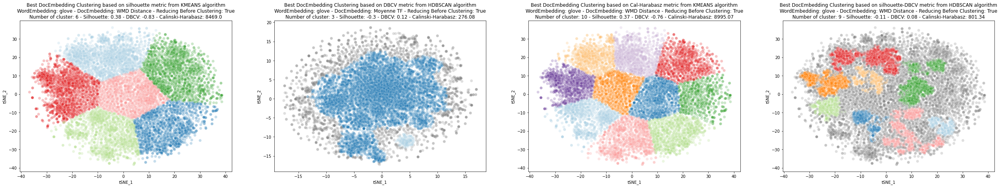

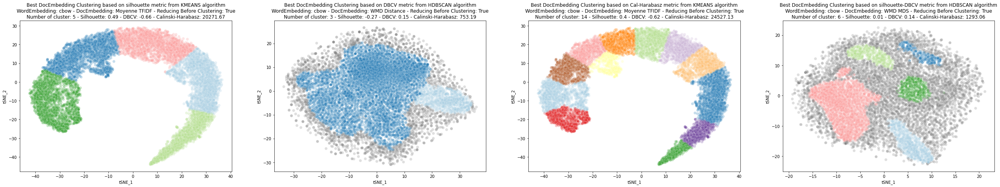

In [84]:
for modele in ["skipgram","glove","cbow"]:
    all_metric = ["silhouette","DBCV", "Cal-Harabasz","silhouette-DBCV"]

    plt.figure(figsize = (44,7))
    for i in range(len(all_metric)):
        Labels, Tsne, Colors, Title = plot_best(df_clustering_after,dict_embedding,clustering_metric=all_metric[i],modele=modele)
        #plot
        sns.scatterplot(Tsne[:,0],Tsne[:,1], s=50, c=Colors, alpha=0.25,ax=plt.subplot(1,len(all_metric),i+1,title=Title,xlabel="tSNE_1",ylabel="tSNE_2"))
    plt.show()
